⭐⭐⭐

# License

This notebook is licensed under the [Creative Commons Attribution-NonCommercial-NoDerivatives 4.0 International License](https://creativecommons.org/licenses/by-nc-nd/4.0/).

You may view and share this work with attribution for non-commercial purposes only. Modification, commercial use, or redistribution of altered versions is strictly prohibited.


# SMS Spam Detection 

<!-- Signature: Jyoshika Barathimogan -->

# Importing Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay, roc_auc_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

from sklearn.utils import resample

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.layers import Conv1D, GlobalMaxPooling1D
from tensorflow.keras.layers import Embedding, LSTM, Bidirectional, Dropout, Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, GRU, Dense, Dropout

from lime.lime_text import LimeTextExplainer



In [2]:
url1 = 'https://raw.githubusercontent.com/SanjanaSriRamadoss/AISC-Project/refs/heads/main/df.csv'
df_all = pd.read_csv(url1)
print("\nHead:")
print(df_all.head())
print(df_all.info())


Head:
                                                text  label
0  AliExpress update: Your package #ORD2UQGY7 is ...      1
1  SG Amazon Alert: You won a reward! Claim here:...      1
2  Taobao update: Your package #ORDOM9D4U is unde...      1
3  Amazon - Order #ELIP3R is on hold. Verify ship...      1
4  Action Required: Shopee delivery could not be ...      1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20844 entries, 0 to 20843
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    20844 non-null  object
 1   label   20844 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 325.8+ KB
None


# Data Cleaning

In [3]:
def plot_label_counts(df, label_column='label'):
    label_counts = df[label_column].value_counts().sort_index()
    
    # Plot the bar chart
    plt.figure(figsize=(8,6))
    label_counts.plot(kind='bar')
    plt.title('Count of Unique Labels')
    plt.xlabel('Label')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()



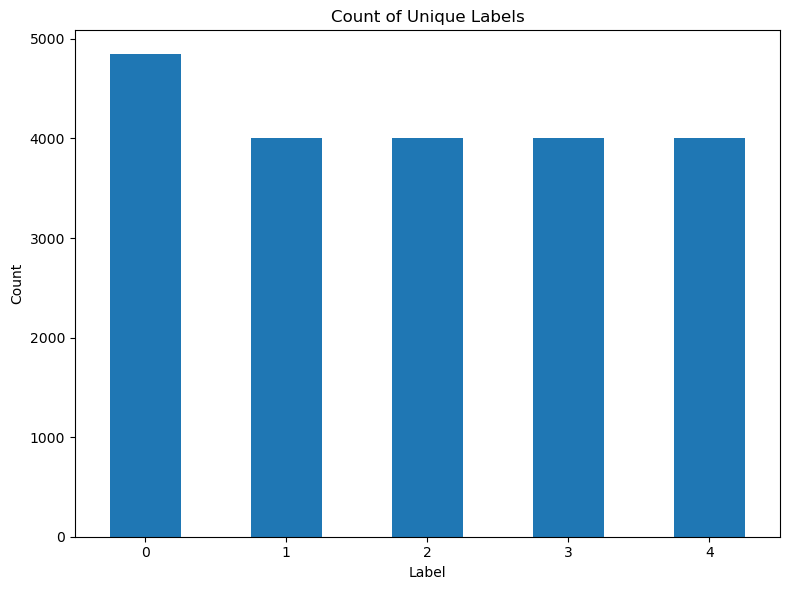

In [4]:
plot_label_counts(df_all, label_column='label')

We plotted the counts for each label. 

    Label 0 (Ham) – 4,844 messages

    Labels 1 to 4 (Scam types) – 4,000 messages each

# Data Preprocessing

## Text Cleaning with NLP

In [5]:
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
ps = PorterStemmer()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\GAdmin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
def clean_text(text):

    if not isinstance(text, str):
        return ""
    text = text.lower()
    text = re.sub(r'[^a-z\s]', '', text)
    tokens = text.split()
    tokens = [ps.stem(word) for word in tokens if word not in stop_words]
    return " ".join(tokens)

In [7]:
df_all['clean_text'] = df_all['text'].apply(clean_text)

Key Components:

- Lowercasing to ensure case-insensitive tokenization.

- Removal of punctuation, numbers, and special characters.

- Tokenization and stopword removal using NLTK.

- Stemming using Porter Stemmer to reduce words to their base form.

## Label Encoding

In [8]:
scam_type_map = {
    'ham': 0,
    'ecom': 1,
    'financial': 2,
    'crypto': 3,
    'phishing': 4
}

Each SMS type was assigned a numeric label.

## Feature Vectorization

In [9]:
vectorizer = TfidfVectorizer(max_features=5000)  # Adjust max_features as needed
X = vectorizer.fit_transform(df_all['clean_text'])


y = df_all['label']

print("TF-IDF shape:", X.shape)

TF-IDF shape: (20844, 5000)


we transformed the text data into numerical features using TF-IDF. Before finalizing TF-IDF, alternatives like Bag-of-Words and Word2Vec were considered. But TF-IDF was chosen for its simplicity, sparsity, and explainability.

Target column = Y ( label )


In [10]:
print(df_all['label'].value_counts())

label
0    4844
1    4000
2    4000
3    4000
4    4000
Name: count, dtype: int64


# Model Training 

## Data Splitting

In [11]:
X_train, X_test, y_train, y_test, df_train, df_test = train_test_split(X, y, df_all, test_size=0.2, random_state=42, stratify=y)

To train and evaluate our models fairly, we splitted the dataset using stratified sampling. Ensures that all labels are proportionally represented in both training and testing sets, which is important in multi-class classification to prevent bias. As 23% of the total data is ham, the same ratio will be preserved in both X_train and X_test.

We decided to use an 80-20 split to divide the dataset:

- 80% for training: good enough data for the model to learn meaningful patterns.

- 20% for testing: sufficient hold-out data to evaluate real-world performance.

In [12]:
def evaluate_model(model, X_test, y_test, model_name="Model"):
    # Class label mapping (integers → names)
    class_labels = [0, 1, 2, 3, 4]
    class_names = ['ham', 'ecom', 'financial', 'crypto', 'phishing']

    # Predict
    y_pred = model.predict(X_test)

    print(f"\n Evaluating: {model_name}")
    print(f" Accuracy: {accuracy_score(y_test, y_pred):.4f}\n")

    # Classification report
    print("Classification Report:")
    print(classification_report(y_test, y_pred, labels=class_labels, target_names=class_names))

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=class_labels)

    # Heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Purples', xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()


Provides a summary table comparing model on accuracy and evulation matrix. So we can easily call this fucntion for all the models.

In [13]:
def evaluate_model(model, X_train, y_train, X_test, y_test, name="Model"):
    print(f"\nEvaluating: {name}")
    
    # Training Accuracy
    train_preds = model.predict(X_train)
    train_acc = accuracy_score(y_train, train_preds)
    print(f"Training Accuracy: {train_acc:.4f}")
    
    # Test Accuracy and Classification Report
    test_preds = model.predict(X_test)
    test_acc = accuracy_score(y_test, test_preds)
    print(f"Test Accuracy: {test_acc:.4f}")
    
    print("\nClassification Report (Test Set):")
    print(classification_report(y_test, test_preds))


A evaluation function designed to print both the training and testing performance of a classification model. It first calculates the training accuracy by comparing the model’s predictions on the training data with the actual labels. It then evaluates the testing accuracy, which reflects how well the model generalizes to unseen data ( which is what we are looking for).It also prints a detailed classification report on the test set on 4 metrics for each label

# Logistic Regression

We began with Logistic Regression as a baseline model due to its simplicity, interpretability, and proven effectiveness in text classification tasks. Logistic Regression performs well on linearly separable data, and when combined with TF-IDF features, it can capture word importance effectively. It's also highly scalable and trains quickly, making it an ideal first choice before exploring more complex models.

In [14]:
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)
evaluate_model(log_reg, X_train, y_train, X_test, y_test, "Logistic Regression")


Evaluating: Logistic Regression
Training Accuracy: 0.9984
Test Accuracy: 0.9981

Classification Report (Test Set):
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       969
           1       1.00      1.00      1.00       800
           2       1.00      1.00      1.00       800
           3       1.00      1.00      1.00       800
           4       1.00      0.99      1.00       800

    accuracy                           1.00      4169
   macro avg       1.00      1.00      1.00      4169
weighted avg       1.00      1.00      1.00      4169



These values indicate very **minimal overfitting**, as performance on unseen data remains consistent with training.

---

**Precision**
Precision of 1.00 across scam classes means the model almost never falsely identifies non-scam messages as scams.

---
**Recall**
indicates that it successfully captured almost all actual scam messages.
The slightly lower recall for phishing (label 4) may be due to overlapping keywords with other scam types, but the drop is negligible.


---
**F1-score**
~1.00 shows a perfect balance between precision and recall.


Logistic Regression performed exceptionally well as being a baseline, achieving nearly perfect accuracy and class-wise performance. This level of performance suggests that the combination of synthetic data + TF-IDF features was highly effective at capturing class distinctions

# Multinomial Naive Bayes

We also trained a Multinomial Naive Bayes (MNB) model, which is another strong baseline for text classification. MNB works under the assumption that features (i.e., words) are conditionally independent given the class. 

It works best when word frequencies dominate the classification signal but may misclassify when words overlap across multiple classes or when dependencies between words matter.



In [15]:
# 2. Multinomial Naive Bayes
nb_model = MultinomialNB()
nb_model.fit(X_train, y_train)
evaluate_model(nb_model,X_train, y_train, X_test, y_test, "Multinomial Naive Bayes")


Evaluating: Multinomial Naive Bayes
Training Accuracy: 0.9918
Test Accuracy: 0.9914

Classification Report (Test Set):
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       969
           1       1.00      1.00      1.00       800
           2       1.00      1.00      1.00       800
           3       1.00      1.00      1.00       800
           4       0.99      0.98      0.98       800

    accuracy                           0.99      4169
   macro avg       0.99      0.99      0.99      4169
weighted avg       0.99      0.99      0.99      4169



These results indicate strong generalization with no significant overfitting. Although slightly lower than Logistic Regression, the accuracy is still extremely high.

Perfect performance on e-commerce, financial, and crypto scams.

Slight drop in precision and recall for ham and phishing classes. This could be due to textual overlaps and Naive Bayes' reliance on word frequencies, which may misinterpret certain neutral or suspicious terms.

# Random Forest

To evaluate the performance of an ensemble-based model, we trained a Random Forest Classifier using 100 decision trees. We didnt limit the tree depth so make sure it grows fully until the leaves are pure. this helps to capture complex decision boundaries. it allows the model to learn specific pattern

In [16]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
evaluate_model(rf_model, X_train, y_train, X_test, y_test, "Random Forest Classifier")


Evaluating: Random Forest Classifier
Training Accuracy: 1.0000
Test Accuracy: 0.9993

Classification Report (Test Set):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       969
           1       1.00      1.00      1.00       800
           2       1.00      1.00      1.00       800
           3       1.00      1.00      1.00       800
           4       1.00      1.00      1.00       800

    accuracy                           1.00      4169
   macro avg       1.00      1.00      1.00      4169
weighted avg       1.00      1.00      1.00      4169



At first glance, these numbers appear perfect. However, such results should be interpreted cautiously.

The model achieved 100% accuracy on training data, which likely means it memorized the data. this is a classic sign of overfitting.

With the large number of trees we set and no regularization (like max depth), tend to fit the training data very tightly.

---

However,  it still generalized extremely well to unseen data (only 0.07% error), which suggests:

- The TF-IDF features are highly separable between classes.

- There is low noise or ambiguity in the dataset (mainly because it's synthetic data).



While the Random Forest model achieved near-perfect results on both training and test data, this could be inflated due to the nature of our dataset.

Therefore, it's crucial to for us to test on real, noisy data and possibly add regularization ( limit tree depth) to prevent overconfidence. Still, these results show that the current features are still extremely effective at separating classes, and this can be a powerful option if appropriately tuned and validated.



# Cross Validation

To further validate our models beyond a single train-test split, we performed 5-fold cross-validation using four key metrics: Accuracy, Precision (macro), Recall (macro), and F1 Score (macro). This ensures that the models generalize well across different subsets of the data and are not overfitting to a particular train-test configuration.

In [18]:
def run_cv(model, X, y, name="Model", cv=5):
    metrics = {
        "accuracy": "Accuracy",
        "precision_macro": "Precision",
        "recall_macro": "Recall",
        "f1_macro": "F1 Score"
    }
    
    print(f"\nCross-Validation Results for {name} ({cv}-fold):")
    for metric_key, metric_name in metrics.items():
        scores = cross_val_score(model, X, y, cv=cv, scoring=metric_key)
        print(f"{metric_name:<10}: {scores.mean():.4f} ± {scores.std():.4f}")



In [19]:
run_cv(log_reg, X, y, "Logistic Regression")
run_cv(nb_model, X, y, "Naive Bayes")
run_cv(rf_model, X, y, "Random Forest")



Cross-Validation Results for Logistic Regression (5-fold):
Accuracy  : 0.9966 ± 0.0013
Precision : 0.9969 ± 0.0013
Recall    : 0.9968 ± 0.0013
F1 Score  : 0.9968 ± 0.0013

Cross-Validation Results for Naive Bayes (5-fold):
Accuracy  : 0.9904 ± 0.0020
Precision : 0.9905 ± 0.0020
Recall    : 0.9911 ± 0.0018
F1 Score  : 0.9908 ± 0.0019

Cross-Validation Results for Random Forest (5-fold):
Accuracy  : 0.9994 ± 0.0002
Precision : 0.9995 ± 0.0002
Recall    : 0.9994 ± 0.0002
F1 Score  : 0.9995 ± 0.0002


**Logistic Regression** 

- Excellent and consistent performance across all folds.

- Low standard deviation (~0.0013) shows high stability.

- Confirms that Logistic Regression is a reliable and interpretable baseline with minimal variance.

---

**Multinomial Naive Bayes**

- Sightly lower average performance (~0.9904 accuracy).

- Slightly higher standard deviation (~0.0020), meaning more variability between folds.

- Still remains somewhat efficient and robust for its simplicity 

---

**Random Forest**

- Highest performance across the board, almost perfect scores (accuracy = 0.9994)

- Lowest variance (± 0.0002), meaning its predictions are incredibly stable regardless of the data slice.

- However, this raises questions about potential overfitting, especially since training accuracy were 100% earlier.

# Deep Learning Models

While traditional machine learning models like Logistic Regression, Naive Bayes, and Random Forests provide strong baselines for text classification, we explored deep learning techniques (LSTM, GRU, CNN) to push the limits of performance and capture more complex language patterns.

Unlike traditional models that rely on handcrafted features (like TF-IDF), deep learning models learn dense vector representations (embeddings) directly from data. 

As new scam types evolve, deep learning models are adaptable and transferable.Great for real world scalability

# Data Cleaning and Preprocessing

In [29]:
def plot_training_history(history):
    # Accuracy
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='x')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


This function visualizes both accuracy and loss for the training and validation sets over each training epoch.It offers immediate feedback on how the model evolves over time.


We are looking for 
- convergence ( is the model is imporving over time?)
- Overfitiing ( does validation loss increase while training loss continue to drop?)
- Underfitting ( do both curves stagnate at low performance?)



# Text Tokenization and Sequence Preparation

In [20]:
max_words = 10000
max_len = 150 

tokenizer = Tokenizer(num_words=max_words, oov_token="<OOV>")


Limits the vocabulary to the top 10,000 most frequent words to reduce noise and memory usage.

Ensures that any word not in the vocabulary is replaced with a special "Out-of-Vocabulary" token, preventing issues with unseen words during inference.

We set the maximum message length to 150 tokens after inspecting message lengths in the dataset. 


In [21]:
tokenizer.fit_on_texts(df_all['clean_text'])
sequences = tokenizer.texts_to_sequences(df_all['clean_text'])
X_seq = pad_sequences(sequences, maxlen=max_len, padding='post', truncating='post')


 Standardizes the length of all sequences to 150 tokens, either padding or truncating as needed. This ensures consistent input shape for neural networks.



In [23]:
y = df_all['label']

In [24]:
X_train_seq, X_test_seq, y_train_seq, y_test_seq = train_test_split(
    X_seq, y, test_size=0.3, random_state=42, stratify=y
)


For training our deep learning models, we used a 70-30 split of the dataset.
As Deep learning models require longer training times. Aslo  model will be evaluated on a larger and more diverse hold-out set. We can better detect overfitting or generalization gaps, especially since deep learning models can memorize training data quickly as our dataset is synthetic

Also, because we already have a relatively large dataset (20K messages), using 30% for testing still leaves 14,000 samples for training, which is more than sufficient for the models to learn effectively.

# LSTM

To enhance our model's understanding of word sequences and capture complex scam patterns in SMS text, we implemented a Bidirectional LSTM neural network

In [26]:
model = Sequential([
    Embedding(input_dim=max_words, output_dim=128),  # Using 128-dimensional embeddings.
    Bidirectional(LSTM(64, return_sequences=False)),  # Bidirectional LSTM to capture context from both directions.
    Dropout(0.4),  # Slightly increased dropout to regularize.
    Dense(64, activation='relu'),
    Dropout(0.3),  # Additional dropout.
    Dense(5, activation='softmax') 
])

**Embedding layer**


Converts integer sequences into 128-dimensional dense word embeddings. This allows the model to learn semantic relationships between words.

---

**Bidirectional**

This helps to captures both forward and backward context in the text, improving understanding of scam patterns and phrasing. As messages where key context appears at the beginning or end.

---

**Dropput**

SMS data (especially synthetic) can lead to overfitting as seem in the ML models. So we added dropout layer that randomly drops 40% of neurons to prevent overfitting, especially important with synthetic datasets.

---

**Dense**

Learns abstract patterns from the sequence output. This layer helps extract deeper scam-related features, such as common sentence structures. Adds a fully connected layer with ReLU to introduce non-linearity.

---

**Dropput**

Additional regularization to reduce co-dependency between nodes.

---


**Output**

Final classification layer with softmax activation for multi-class output (5 scam types including ham).


In [27]:
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


Since we didnt do one hot encoding , we used sparse. It measures the difference between the predicted probability distribution and the true class.

By default we used Adam and accuracy as the metrics

In [28]:
history = model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_test_seq, y_test_seq),
    epochs=5,
    batch_size=64
)


Epoch 1/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 81s 345ms/step - accuracy: 0.6593 - loss: 0.8179 - val_accuracy: 0.9938 - val_loss: 0.0211
Epoch 2/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 75s 329ms/step - accuracy: 0.9973 - loss: 0.0132 - val_accuracy: 0.9989 - val_loss: 0.0050
Epoch 3/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 70s 309ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.9990 - val_loss: 0.0049
Epoch 4/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 67s 293ms/step - accuracy: 0.9999 - loss: 0.0012 - val_accuracy: 0.9990 - val_loss: 0.0061
Epoch 5/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 71s 312ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.9994 - val_loss: 0.0039


We trained the Bidirectional LSTM model for 5 epochs using a batch size of 64. 

The training time ( 70–80s per epoch means total training time ≈ 6–7 minutes. ) 

**Observations:**

**1. Massive Jump from Epoch 1 to 2**

Train Accuracy jumps from 66% to 99.7% while loss drops from 0.82 to 0.01. This is extremely steep. This can suggest that the model learned the structure of the data very fast, likely due to synthetic input with distinct class boundaries. But in the real-world noisy data, such a jump is rare.

---

**2.Plateau in Validation Accuracy from Epoch 3 to 5**

Val Accuracy hovers around 0.9990–0.9994, even though train accuracy goes up to 0.9999. This plateau implies that model has already reached its performance ceiling by epoch 2–3. Additional training brings no significant generalization improvement.
Early stopping could be introduced at Epoch 3 to save time and prevent overfitting.

It could plateau faster with a **learning rate decay** or **ReduceLROnPlateau**.

---

**3.Train Accuracy > Validation Accuracy**

There's minor overfitting. But it looks controlled as val accuracy does not drop and val loss fluctuates slightly. Dropout layers likely helped here. But it’s still something to monitor

---

**4.Loss Fluctuation in Validation from Epoch 3 - 4**

Val Loss: 0.0049, increases to 0.0061 and drops to 0.0039. This can suggest slight variance in how well the model fits certain batches of messages


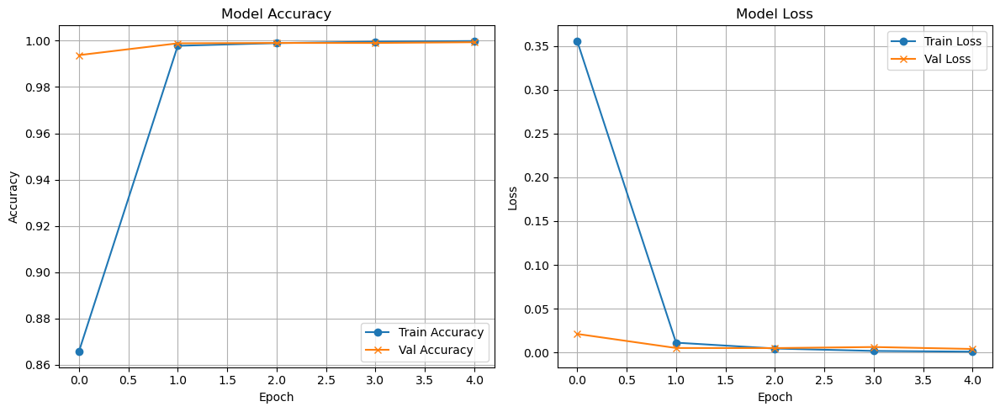

In [30]:

plot_training_history(history)


**Epoch 0**

- Starts at around 86% training accuracy, but validation accuracy is already high at around 99%.

- This indicates the model is underfitting on the first epoch, it hasn’t learned enough yet, but the validation set contains easy-to-learn or well-separated examples.

**Epoch 1 onward** 

- A sharp spike in training accuracy (99.7%), and validation accuracy also reaches 99.9% and stabilizes.

- This shows that the model quickly learns the patterns in the dataset.

- The training and validation accuracy curves track closely, which is a strong indicator of generalization 

**Flat after Epoch 2**

- Little to no gain after Epoch 2.

- It might reached its optimal learning capacity.

- Further training beyond Epoch 2 is unnecessary, and could be cut short using early stopping to save resources.

In [31]:
test_loss, test_accuracy = model.evaluate(X_test_seq, y_test_seq, verbose=0)
print("\n LSTM Test Accuracy: {:.4f}".format(test_accuracy))


 LSTM Test Accuracy: 0.9994


In [32]:
y_pred_probs = model.predict(X_test_seq)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = y_test_seq  

scam_type_map = {0: 'ham', 1: 'ecom', 2: 'financial', 3: 'crypto', 4: 'phishing'}
target_names = list(scam_type_map.values())

accuracy = accuracy_score(y_true, y_pred)
print(f"Overall Model Accuracy: {accuracy:.4f}\n")

print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))


196/196 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step
Overall Model Accuracy: 0.9994

Classification Report:
              precision    recall  f1-score   support

         ham       1.00      1.00      1.00      1454
        ecom       1.00      1.00      1.00      1200
   financial       1.00      1.00      1.00      1200
      crypto       1.00      1.00      1.00      1200
    phishing       1.00      1.00      1.00      1200

    accuracy                           1.00      6254
   macro avg       1.00      1.00      1.00      6254
weighted avg       1.00      1.00      1.00      6254



The final LSTM model achieved 99.94% accuracy on the test set with perfect precision, recall, and F1-scores across all classes. This level of performance reflects both the model's capacity and the dataset's clarity. While impressive, real-world deployment should include further testing on messy, real SMS data to ensure robustness beyond synthetic conditions.


**Precision**
Every predicted class label was correct. 0 false positives.

**Recall**
Every actual class label was correctly captured. 0 false negatives.

**F1-Score** 
Perfect harmonic balance between precision and recall.

The model has mastered the patterns in this dataset.It can distinguish not just spam vs ham, but the exact scam type too.The multi-class setup, embedding layer, and LSTM sequence learning all worked in harmony.

Macro avg treats all classes equally, even if one is bigger. This suggest that even ham (the bigger class) and ecom/finance/crypto/phishing (same size) were all treated fairly and perfectly by the model.

## Convolutional Neural Network

While CNNs are traditionally known for image processing, they’ve proven to be highly effective in text classification tasks due to their ability to extract local patterns in data.

we realised that we can take advantage of cnn invariance as it learns patterns regardless of where they appear in the sentence. This is key in SMS where scam phrases can appear anywhere. We feel that CNN is ideal for learning to spot these scam fragments and make a prediction based on detected patterns like "urgent updates', 'verify'

In [33]:
cnn_model = Sequential([
    Embedding(input_dim=max_words, output_dim=128, input_length=max_len),
    Conv1D(128, 5, activation='relu'),
    GlobalMaxPooling1D(),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dense(5, activation='softmax')
])

C:\Users\GAdmin\anaconda3\Lib\site-packages\keras\src\layers\core\embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


**Embedding**
Transforms each SMS into a 150-word padded sequence, with each word represented as a 128-dimensional dense vector. 

---

**Conv1D**
Applies 128 1D convolutional filters, each with a kernel size of 5, meaning each filter slides over 5 consecutive words at a time. This is analogous to learning 5-gram patterns from the input text. 

---

**GlobalMaxPooling**
For each filter, selects the single highest activation across the entire sequence. So it keeps only the strongest match for each scam pattern learned by the filters.

---

**Dropout**

Randomly disables 30% of the neurons during training. This acts as regularization to prevent the model from memorizing exact patterns in the training data.

---

**Dense**
A fully connected layer with 64 neurons. ReLU activation enables it to model complex, non-linear combinations of features from the convolutional filters. Helps to combine multiple scam indicators detected by different filters  into a coherent prediction signal.


In [34]:
cnn_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [35]:
history_cnn = cnn_model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_test_seq, y_test_seq),
    epochs=5,
    batch_size=64
)


Epoch 1/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - accuracy: 0.8075 - loss: 0.6861 - val_accuracy: 0.9989 - val_loss: 0.0065
Epoch 2/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - accuracy: 0.9992 - loss: 0.0046 - val_accuracy: 0.9987 - val_loss: 0.0025
Epoch 3/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - accuracy: 0.9999 - loss: 0.0010 - val_accuracy: 0.9998 - val_loss: 0.0011
Epoch 4/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - accuracy: 0.9999 - loss: 6.1802e-04 - val_accuracy: 0.9989 - val_loss: 0.0034
Epoch 5/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - accuracy: 0.9999 - loss: 3.3359e-04 - val_accuracy: 0.9997 - val_loss: 0.0010


We trained the 1D CNN model for 5 epochs, batch size of 64

**Epoch 1**

Even with a relatively modest training accuracy in Epoch 1, validation shoots up. the gap suggest that CNN learns local scam patterns fast, even in the first pass.And also the validation set is clean and easy to classify

---

**Fast Convergence by Epoch 2 - 3**

Training Accuracy jumps from 80% to 99.92% in one epoch while loss drops drastically from 0.68 to 0.0046. But Val accuracy remains stable, suggesting the model is not overfitting, just mastering the features quickly. This is because CNNs are great at phrase-level feature extraction. 

---

Epochs took 23–27s each which is significantly faster than LSTM. it alos shows no divergence, no overfitting, no instability


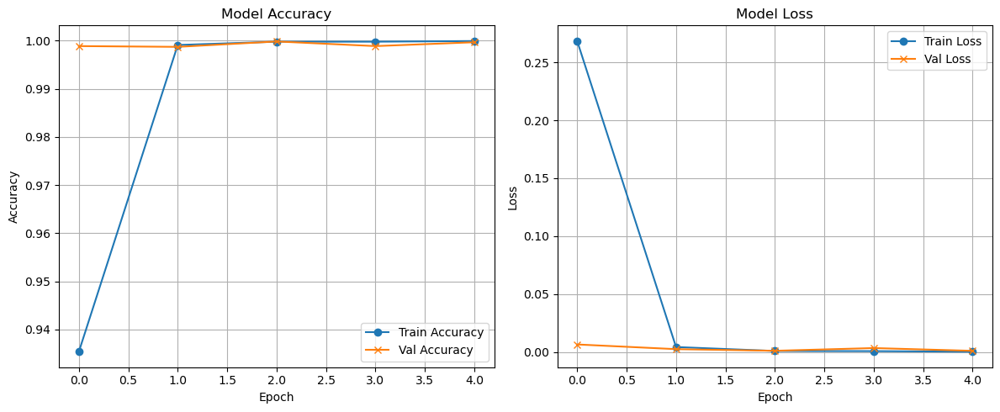

In [36]:
plot_training_history(history_cnn)

In [37]:
y_pred_cnn_probs = cnn_model.predict(X_test_seq)
y_pred_cnn = np.argmax(y_pred_cnn_probs, axis=1)
y_true = y_test_seq 
scam_type_map = {0: 'ham', 1: 'ecom', 2: 'financial', 3: 'crypto', 4: 'phishing'}
target_names = list(scam_type_map.values())

cnn_accuracy = accuracy_score(y_true, y_pred_cnn)
print(f"CNN Model Accuracy: {cnn_accuracy:.4f}\n")

print("Classification Report:")
print(classification_report(y_true, y_pred_cnn, target_names=target_names))


196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step
CNN Model Accuracy: 0.9997

Classification Report:
              precision    recall  f1-score   support

         ham       1.00      1.00      1.00      1454
        ecom       1.00      1.00      1.00      1200
   financial       1.00      1.00      1.00      1200
      crypto       1.00      1.00      1.00      1200
    phishing       1.00      1.00      1.00      1200

    accuracy                           1.00      6254
   macro avg       1.00      1.00      1.00      6254
weighted avg       1.00      1.00      1.00      6254



 The results demonstrate exceptional performance in identifying and differentiating between five SMS message categories.
 
 
Each class achieved a perfect precision, recall, and F1-score

- Never misclassified a message into another category (Recall = 1.00)

- Never falsely predicted a message as that class unless it actually was (Precision = 1.00)

- Maintained perfect balance between the two (F1-score = 1.00)

Such perfect results (1.000 across all metrics) are extremely rare in natural, real-world datasets.

This model must be tested on messy, live data to truly validate its robustness. 

# Gated Recurrent Unit

The GRU model was chosen as a lightweight, efficient alternative to LSTM. With bidirectional context and gated memory, it is capable of understanding scam-related sequences while maintaining lower computational cost. Its architecture is optimized for short text like SMS, and Dropout layers further ensure that the model generalizes well.

Since GRU uses 2 gates (update and reset) until LSTM( inout, forgot, output). It asso require fewer parameters and it is faster. It is great for short-to-medium sequences like SMS messages.

In [41]:
gru_model = Sequential([
    Embedding(input_dim=max_words, output_dim=128),  
    Bidirectional(GRU(64, return_sequences=False)),   
    Dropout(0.4),                                      
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(5, activation='softmax')  
])


**Embedding layer**


Converts integer sequences into 128-dimensional dense word embeddings. This allows the model to learn semantic relationships between words and scam-related terminology.

---

**Bidirectional**

This helps to captures both forward and backward context in the text, improving understanding of scam patterns and phrasing. As messages where key context appears at the beginning or end.

---

**Dropput**

SMS data (especially synthetic) can lead to overfitting as seem in the ML models. So we added dropout layer that randomly drops 40% of neurons to prevent overfitting, especially important with synthetic datasets.

---

**Dense**

Learns abstract patterns from the sequence output. This layer helps extract deeper scam-related features, such as common sentence structures. Adds a fully connected layer with ReLU to introduce non-linearity.

---

**Dropput**

Additional regularization to reduce co-dependency between nodes.

---


**Output**

Final classification layer with softmax activation for multi-class output. Outputs probabilities across 5 classes

In [42]:
gru_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [43]:
history_gru = gru_model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_test_seq, y_test_seq),
    epochs=5,
    batch_size=64
)


Epoch 1/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 85s 360ms/step - accuracy: 0.7062 - loss: 0.7899 - val_accuracy: 0.9934 - val_loss: 0.0218
Epoch 2/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 78s 344ms/step - accuracy: 0.9988 - loss: 0.0073 - val_accuracy: 0.9992 - val_loss: 0.0021
Epoch 3/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 80s 352ms/step - accuracy: 0.9998 - loss: 0.0017 - val_accuracy: 0.9994 - val_loss: 0.0024
Epoch 4/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 66s 287ms/step - accuracy: 1.0000 - loss: 7.4608e-04 - val_accuracy: 0.9990 - val_loss: 0.0051
Epoch 5/5
228/228 ━━━━━━━━━━━━━━━━━━━━ 85s 302ms/step - accuracy: 0.9999 - loss: 9.9205e-04 - val_accuracy: 0.9994 - val_loss: 0.0033


The model was trained for 5 epochs, batch size 64.


**Initial Learning Curve**

raining accuracy jumps from 70.62% to 99.88% in a single epoch. Train loss plummets from 0.7899 to 0.0073. maybe GRU captured scam-intent patterns quickly

---

**Validation Accuracy Remains Strong**

Val accuracy remains consistently above 99.3%, peaking at 99.94% in Epochs 3 - 5.This shows the model generalizes well despite very tight-fitting training behavior

---

Average per-epoch time was 80s. Theoretically, GRU should be faster than LSTM (fewer gates), but when using bidirectional layers, training time still gets heavy due to processing both directions.




Both LSTM and GRU achieved near-perfect results on this dataset.


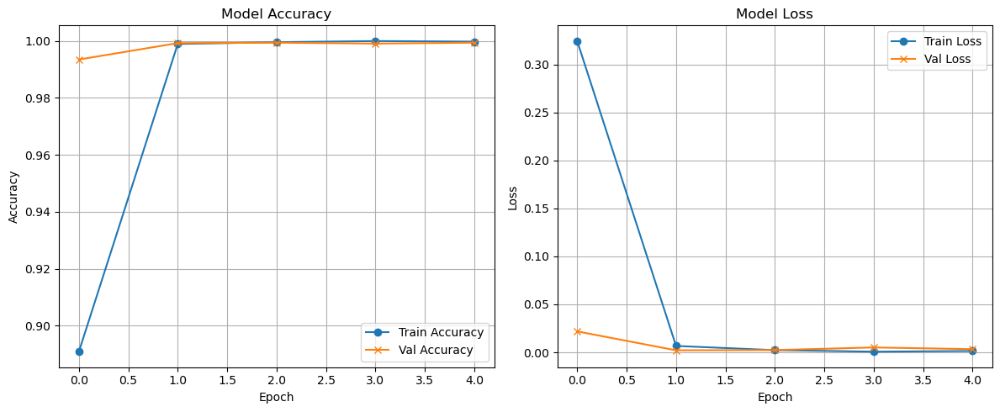

In [44]:
plot_training_history(history_gru)

In [45]:
y_pred_gru_probs = gru_model.predict(X_test_seq)
y_pred_gru = np.argmax(y_pred_gru_probs, axis=1)
y_true = y_test_seq 

scam_type_map = {0: 'ham', 1: 'ecom', 2: 'financial', 3: 'crypto', 4: 'phishing'}
target_names = list(scam_type_map.values())

accuracy_gru = accuracy_score(y_true, y_pred_gru)
print(f"GRU Model Accuracy: {accuracy_gru:.4f}\n")

print("Classification Report:")
print(classification_report(y_true, y_pred_gru, target_names=target_names))


196/196 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step
GRU Model Accuracy: 0.9994

Classification Report:
              precision    recall  f1-score   support

         ham       1.00      1.00      1.00      1454
        ecom       1.00      1.00      1.00      1200
   financial       1.00      1.00      1.00      1200
      crypto       1.00      1.00      1.00      1200
    phishing       1.00      1.00      1.00      1200

    accuracy                           1.00      6254
   macro avg       1.00      1.00      1.00      6254
weighted avg       1.00      1.00      1.00      6254



**Overall Accuracy**

The GRU model achieved 99.94% test accuracy, matching LSTM and CNN. This indicates exceptional generalization and near-perfect prediction performance on the unseen test set.

---

**Precision, Recall, F1-Score**

Each class, ham, e-commerce, financial, crypto, phishing, reached perfect scores across all metrics.
This means the model had zero false positives and zero false negatives, correctly identifying every class instance.

---

**Inference Speed**
The evaluation step took only 13 seconds for 6,254 messages, showing GRU is efficient at inference.

--- 

The GRU model delivered perfect classification performance, just like LSTM and CNN. However, its faster convergence, lower complexity, and lighter computational footprint make it a strong candidate for production deployment

# LIME Explainer - HCAI

Machine learning models and deep learning models like are often black boxes, they tell you what they predict, but not why

---

**LIME explains individual predictions by**

- Perturbing the input,

- Observing how the model's prediction changes

- Identifying which parts of the input contributed most to the final decision.


We decided to use log regression for lime. As LR is a linear, interpretable model. It is much easier to explain because the relationship between input features , the words, and output is direct and proportional.



In [15]:
scam_type_map = {0: 'ham', 1: 'ecom', 2: 'financial', 3: 'crypto', 4: 'phishing'}
class_names = list(scam_type_map.values())

explainer = LimeTextExplainer(class_names=class_names)


In [16]:
def predict_proba_logreg(texts):
    X_tfidf = vectorizer.transform(texts)
    return log_reg.predict_proba(X_tfidf)


In [18]:
from collections import defaultdict

explained_per_class = defaultdict(int)
max_per_class = 2
samples_needed = max_per_class * len(scam_type_map)

count = 0
for idx, row in df_all.iterrows():
    label = row['label']
    if explained_per_class[label] < max_per_class:
        text_to_explain = row['text']
        print(f"\nExplaining sample {idx} — label: {scam_type_map[label]}")
        
        exp = explainer.explain_instance(
            text_to_explain,
            predict_proba_logreg,
            num_features=10,
            top_labels=1
        )
        exp.show_in_notebook()

        explained_per_class[label] += 1
        count += 1

    if count >= samples_needed:
        break



Explaining sample 0 — label: ecom



Explaining sample 1 — label: ecom



Explaining sample 4000 — label: financial



Explaining sample 4001 — label: financial



Explaining sample 8000 — label: crypto



Explaining sample 8001 — label: crypto



Explaining sample 12000 — label: phishing



Explaining sample 12001 — label: phishing



Explaining sample 16000 — label: ham



Explaining sample 16001 — label: ham


LIME was applied to 2 samples per class (ham, e-commerce, financial, crypto, phishing) to understand which words influenced the Logistic Regression model’s decisions.

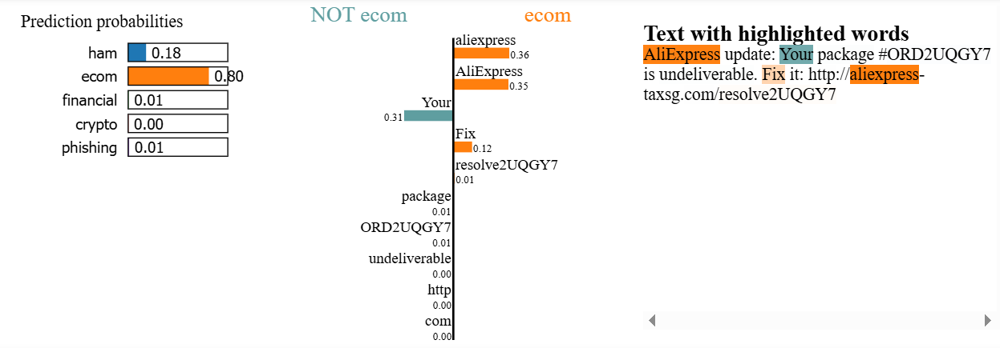

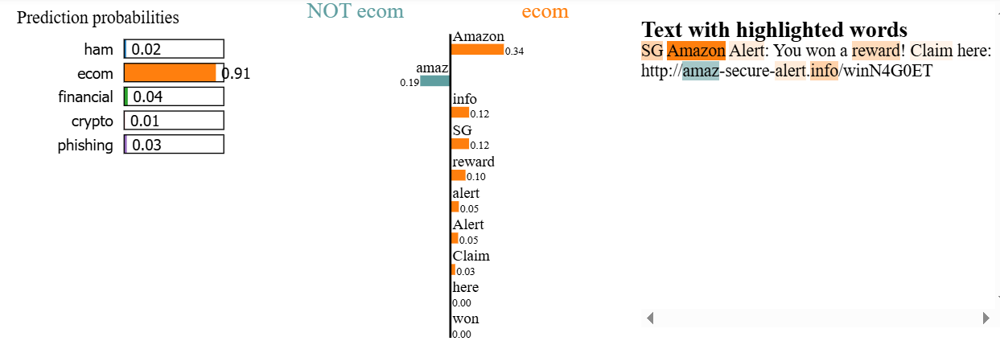

Top words: "AliExpress", "Amazon", "Alert", "reward", "Claim".

LIME shows that brand names and urgency words (like "alert", "claim") heavily influence scam predictions.

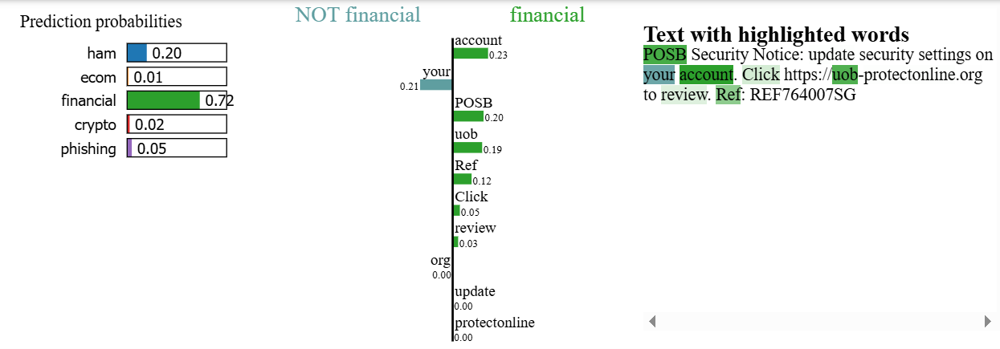

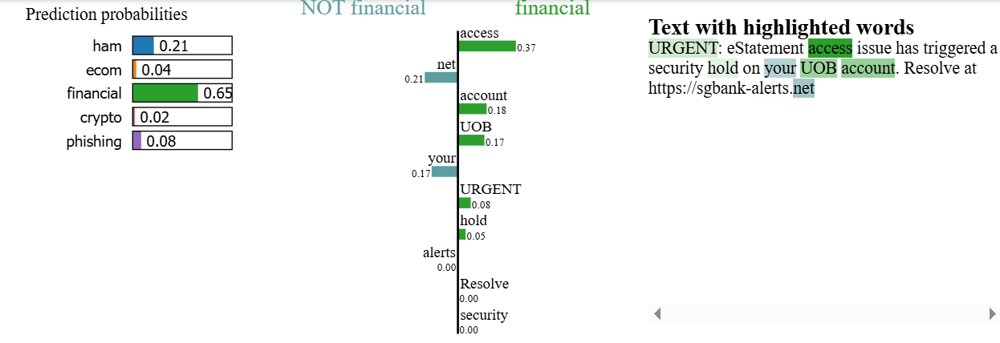

Top words: "account", "POSB", "UOB", "URGENT", "Ref", "review".

Strong focus on bank names, account access, and action verbs like "review", indicating financial urgency

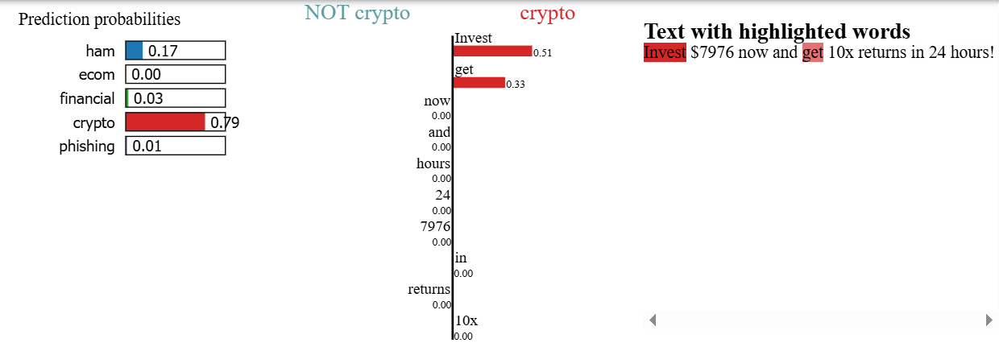

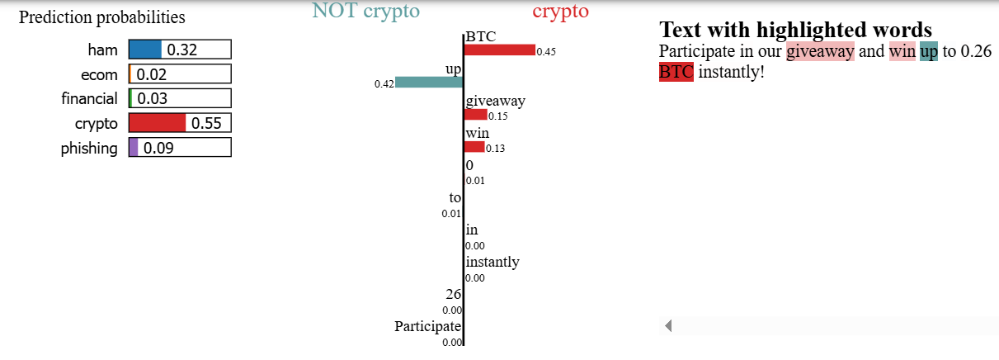

Top words: "Invest", "BTC", "giveaway", "returns", "win".

Model detects investment promises and crypto references accurately.

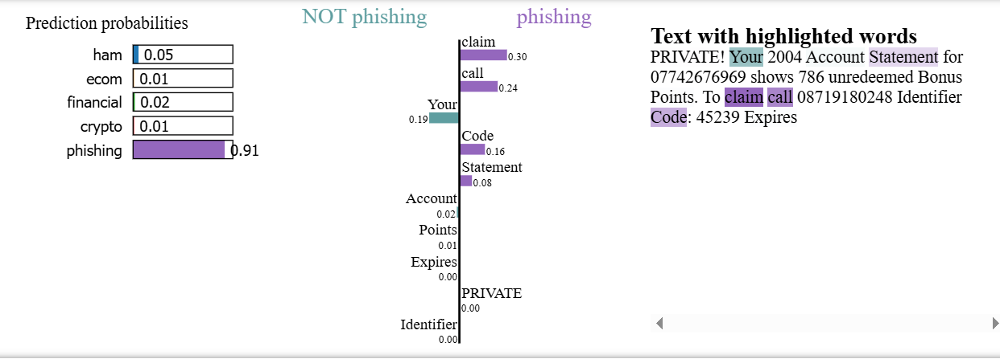

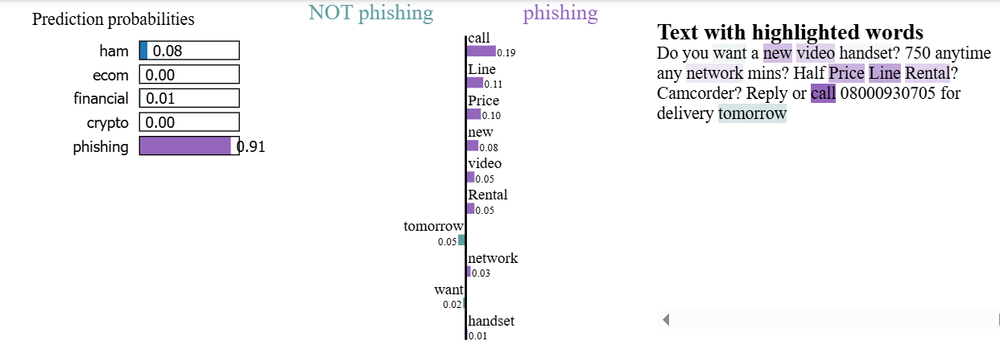

Top words: "claim", "call", "Code", "Account", "PRIVATE".

LIME captures typical phishing bait words (claim, call now) and privacy-related urgencies ("private", "code", "identifier").

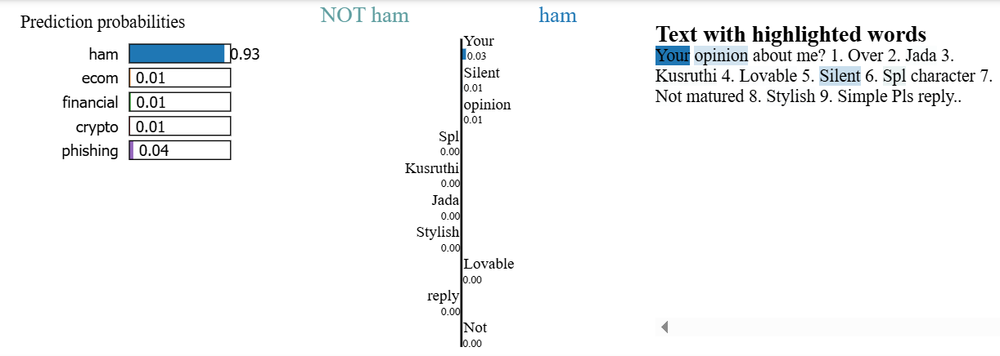

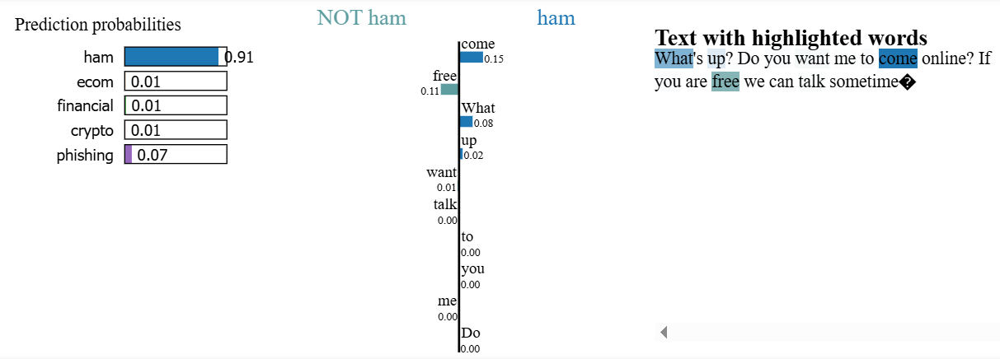

Top words: "Silent", "Stylish", "Lovable", "opinion", "free".

Harmless casual conversation topics are identified, with very low influence from scam-related terms.

Using LIME enhances the system's alignment with Human-Centered AI (HCAI) principles. By providing transparent explanations of why a message was flagged as scam or ham, the system respects the user's right to understand AI decisions.

LIME explanations make the model's decision-making process accessible and understandable to even non-technical users. This builds trust and increases accountability, both of which are core goals of HCAI.

Instead of blindly trusting the model’s prediction, users can now see which specific words or phrases led to the classification. This empowers users to validate, or understand model outputs, leading to a more collaborative human-AI interaction.

<!-- Signature: Jyoshika Barathimogan -->

## Saving Model 

In [51]:
import joblib

# Save vectorizer
joblib.dump(vectorizer, 'tfidf_vectorizer.pkl')

# Save logistic regression model
joblib.dump(log_reg, 'log_reg_model.pkl')


['log_reg_model.pkl']

# THANK YOU